# Masking data <img align="right" src="../Supplementary_data/DE_Africa_Logo_Stacked_RGB_small.jpg">

* **Products used:** 
[ls8_usgs_sr_scene](https://explorer.digitalearth.africa/ls8_usgs_sr_scene) 


## Background
In the past, remote sensing researchers would reject partly cloud-affected scenes in favour of cloud-free scenes. 
However, multi-temporal analysis techniques increasingly make use of every quality assured pixel within a time series of observations. 
The capacity to automatically exclude low quality pixels (e.g. clouds, shadows or other invalid data) is essential for enabling these new remote sensing methods.

Analysis-ready satellite data from Digital Earth Africa includes pixel quality information that can be used to easily "mask" data (i.e. keep only certain pixels in an image) to obtain a time series containing only clear or cloud-free pixels.

## Description
In this notebook, we show how to mask Digital Earth Africa satellite data using boolean masks. The notebook demonstrates how to:

1. Load in a time series of satellite data including the `pixel_qa` pixel quality band
2. Inspect the band's `flags_definition` attributes
3. Create clear and cloud-free masks and apply these to the satellite data
4. Buffer cloudy/shadowed pixels by dilating the masks by a specified number of pixels 
5. Mask out invalid nodata values and replace them with `NaN`

Digital Earth Africa provides wrapper functions that will automatically provide cloud-masked satellite data, more information can be found in the [Using_load_ard](./Using_load_ard.ipynb) notebook.

***

## Getting started
First we import relevant packages and connect to the datacube. 
Then we define our example area of interest and load in a time series of satellite data.

In [1]:
%matplotlib inline

import scipy.ndimage
import xarray
import numpy
import datacube
from datacube.storage.masking import make_mask
from datacube.storage.masking import mask_invalid_data

from deafrica_tools.plotting import rgb
from deafrica_tools.datahandling import dilate, mostcommon_crs

/env/lib/python3.6/site-packages/datacube/storage/masking.py:4: DeprecationWarning: datacube.storage.masking has moved to datacube.utils.masking
  category=DeprecationWarning)


### Connect to the datacube

In [2]:
dc = datacube.Datacube(app="Masking_data")

## Create a query and load satellite data

To demonstrate how to mask satellite data, we will load Landsat 8 surface reflectance RGB data along with a pixel quality classification band called `pixel_qa`.

In [3]:
# Region of interest
lat, lon = 12.791, -15.502
buffer = 0.1

# Create a reusable query
query = {
    'x': (lon-buffer, lon+buffer),
    'y': (lat+buffer, lat-buffer),
    'time': ('2016-08', '2016-12-06'),
}

# Identify the most common projection system in the input query
output_crs = mostcommon_crs(dc=dc, product='ls8_usgs_sr_scene', query=query)

# Load data from the Landsat-8
data = dc.load(product="ls8_usgs_sr_scene",
               measurements=["blue", "green", "red", "pixel_qa"],
               output_crs=output_crs,
               resolution=[-30, 30],
               align=(15, 15),
               **query)
print(data)

<xarray.Dataset>
Dimensions:      (time: 8, x: 726, y: 739)
Coordinates:
  * time         (time) datetime64[ns] 2016-08-15T11:21:45.232634 ... 2016-12...
  * y            (y) float64 1.425e+06 1.425e+06 ... 1.403e+06 1.403e+06
  * x            (x) float64 4.346e+05 4.347e+05 ... 4.564e+05 4.564e+05
    spatial_ref  int32 32628
Data variables:
    blue         (time, y, x) int16 293 270 315 116 130 ... 378 480 475 621 390
    green        (time, y, x) int16 832 806 899 618 601 ... 671 784 712 874 649
    red          (time, y, x) int16 674 661 830 490 453 ... 773 945 966 1184 695
    pixel_qa     (time, y, x) uint16 322 322 322 322 322 ... 322 322 322 322 322
Attributes:
    crs:           epsg:32628
    grid_mapping:  spatial_ref


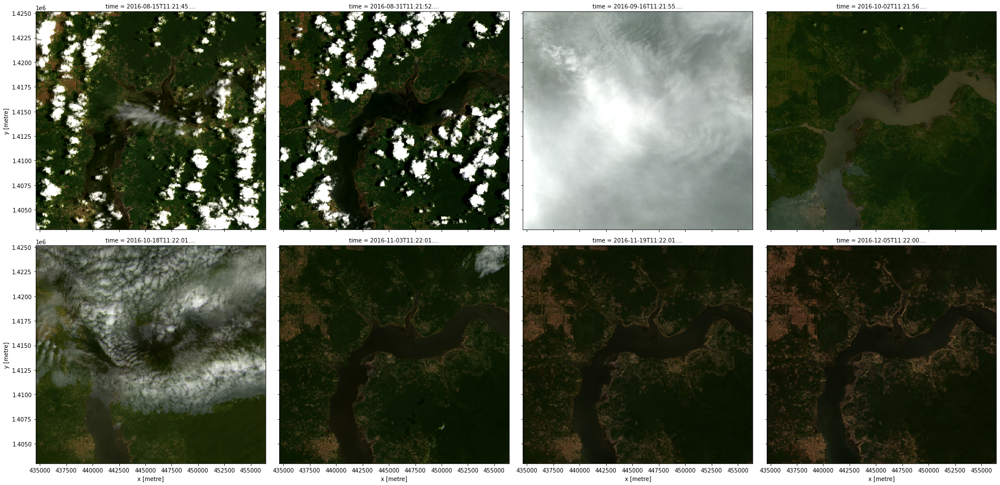

In [4]:
# Plot the data
rgb(data, col="time")

The absence of satellite observation is indicated by a "nodata" value for the band, which is listed under the **Attributes** category of the returned `xarray.DataArray`.

In [5]:
data.red

<xarray.DataArray 'red' (time: 8, y: 739, x: 726)>
array([[[ 674,  661,  830, ..., 2600, 3211, 3834],
        [ 838,  635,  947, ..., 3010, 3544, 4024],
        [ 832,  927, 1089, ..., 2938, 3578, 3945],
        ...,
        [5741, 5795, 6041, ..., 1656, 1597, 1300],
        [5436, 5728, 6046, ..., 1443, 1513, 1295],
        [5771, 5990, 6116, ..., 1194, 1209,  911]],

       [[ 584,  512,  680, ..., 4813, 4862, 5028],
        [ 544,  452,  688, ..., 4639, 4705, 5206],
        [ 676,  659,  825, ..., 5278, 5237, 5986],
        ...,
        [1240, 1607, 1821, ..., 1076, 1064,  893],
        [1276, 2049, 2244, ...,  946,  781,  657],
        [2073, 2350, 2509, ...,  625,  784,  489]],

       [[2806, 2808, 2824, ..., 2495, 2506, 2519],
        [2838, 2845, 2854, ..., 2476, 2499, 2513],
        [2857, 2857, 2861, ..., 2463, 2495, 2522],
        ...,
...
        ...,
        [ 308,  316,  310, ..., 1245, 1149,  710],
        [ 292,  297,  299, ..., 1080, 1048,  737],
        [ 287,  313,  302, ...,  834,  935,  568]],

       [[ 452,  553,  595, ...,  427,  401,  437],
        [ 489,  567,  672, ...,  503,  449,  429],
        [ 730,  677,  654, ...,  471,  472,  446],
        ...,
        [ 340,  336,  327, ..., 1284, 1167,  813],
        [ 345,  318,  309, ..., 1155, 1155,  810],
        [ 359,  371,  300, ...,  875,  941,  649]],

       [[ 469,  577,  629, ...,  448,  412,  428],
        [ 586,  503,  714, ...,  505,  479,  398],
        [ 726,  703,  712, ...,  463,  512,  419],
        ...,
        [ 352,  353,  359, ..., 1415, 1374,  885],
        [ 330,  323,  337, ..., 1257, 1300,  928],
        [ 326,  346,  316, ...,  966, 1184,  695]]], dtype=int16)
Coordinates:
  * time         (time) datetime64[ns] 2016-08-15T11:21:45.232634 ... 2016-12...
  * y            (y) float64 1.425e+06 1.425e+06 ... 1.403e+06 1.403e+06
  * x            (x) float64 4.346e+05 4.347e+05 ... 4.564e+05 4.564e+05
    spatial_ref  int32 32628
Attributes:
    units:         reflectance
    nodata:        -9999
    crs:           epsg:32628
    grid_mapping:  spatial_ref

We see that the `nodata` attribute reports the value -9999.

We can find the classification scheme of the `pixel_qa` band in its flags definition.

In [6]:
data.pixel_qa.attrs["flags_definition"]

{'snow': {'bits': 4, 'values': {'0': 'no_snow', '1': 'snow'}},
 'clear': {'bits': 1, 'values': {'0': 'no_clear_land', '1': 'clear_land'}},
 'cloud': {'bits': 5, 'values': {'0': 'no_cloud', '1': 'cloud'}},
 'water': {'bits': 2, 'values': {'0': 'no_water', '1': 'water'}},
 'nodata': {'bits': 0, 'values': {'0': False, '1': True}},
 'pixel_qa': {'bits': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
  'values': {'1': 'Fill',
   '2': 'Clear',
   '4': 'Water',
   '8': 'Cloud shadow',
   '16': 'Snow',
   '32': 'Cloud',
   '64': 'Cloud Confidence Low Bit',
   '128': 'Cloud Confidence High Bit',
   '256': 'Cirrus Confidence Low Bit',
   '512': 'Cirrus Confidence High Bit',
   '1024': 'Unused',
   '2048': 'Unused',
   '4096': 'Unused',
   '8192': 'Unused',
   '16384': 'Unused',
   '32786': 'Unused'},
  'description': 'Level 2 Pixel Quality Band'},
 'cloud_shadow': {'bits': 3,
  'values': {'0': 'no_cloud_shadow', '1': 'cloud_shadow'}},
 'cloud_confidence': {'bits': [6, 7],
  'values': {'

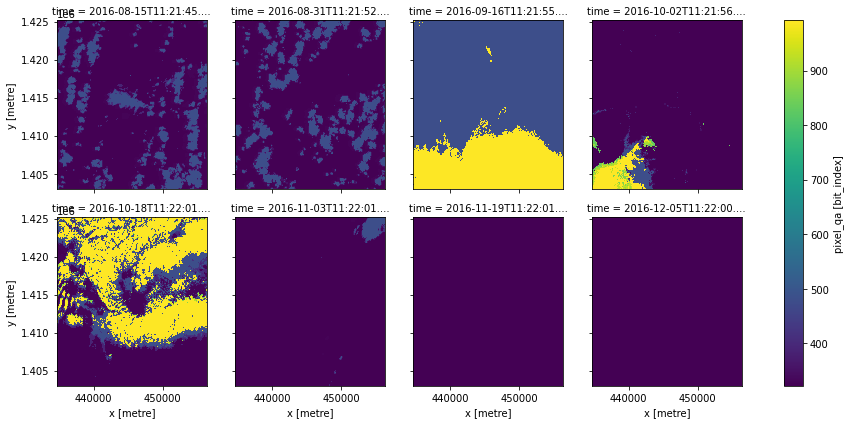

In [7]:
data.pixel_qa.plot(col="time", col_wrap=4)

We see that `pixel_qa` also reports the `nodata` pixels, and along with the cloud and shadow pixels, it also picks up aerosol and water pixels.

## Cloud-free images

### Creating the clear-pixel mask

We create a mask by specifying conditions that our pixels must satisfy.
But we will only need the labels (not the values) to create a mask.

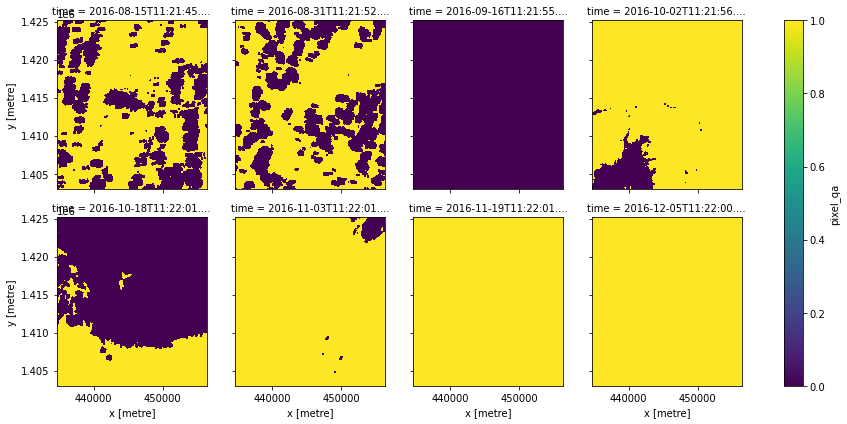

In [8]:
# Create the mask based on "valid" pixels
quality_flags_prod = {'cloud_shadow': 'no_cloud_shadow',
                      'cloud': 'no_cloud',
                      'nodata': False}

#Use the datacube make_mask fucntion to create the clear pixels mask
clear_mask = make_mask(data['pixel_qa'], **quality_flags_prod)

#plot
clear_mask.plot(col="time", col_wrap=4)

### Applying the clear-pixel mask
We can now get the clear images we want.

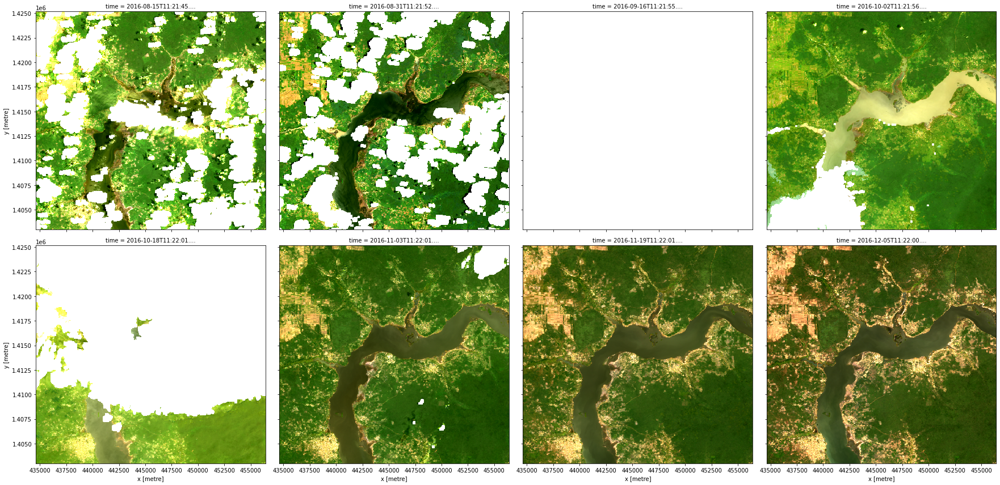

In [9]:
# Apply the mask
clear = data.where(clear_mask)

rgb(clear, col="time")

## Mask dilation

Sometimes we want our cloud masks to be more conservative and mask out more than just the pixels that `pixel_qa` classified as cloud or cloud shadow.
That is, sometimes we want a buffer around the cloud and the shadow.
We can achieve this by dilating the mask using the `dilate` function from `deafrica_datahandling`.

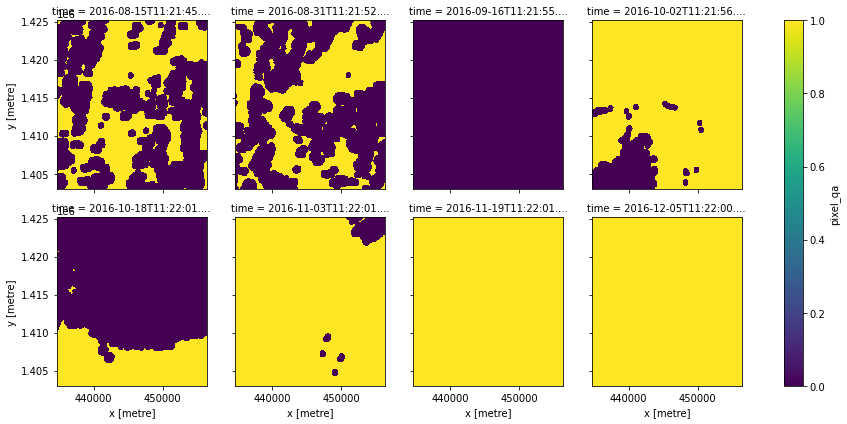

In [10]:
# Set the number of pixels we want to buffer cloud and cloud shadow by
dilation_in_pixels = 10

# Apply the `dilate` function to each array in `cloud_free_mask`
# and return a matching xarray.DataArray object
buffered_mask = xarray.apply_ufunc(dilate, 
                                   clear_mask, 
                                   dilation_in_pixels, 
                                   keep_attrs=True)

buffered_mask.plot(col="time", col_wrap=4)

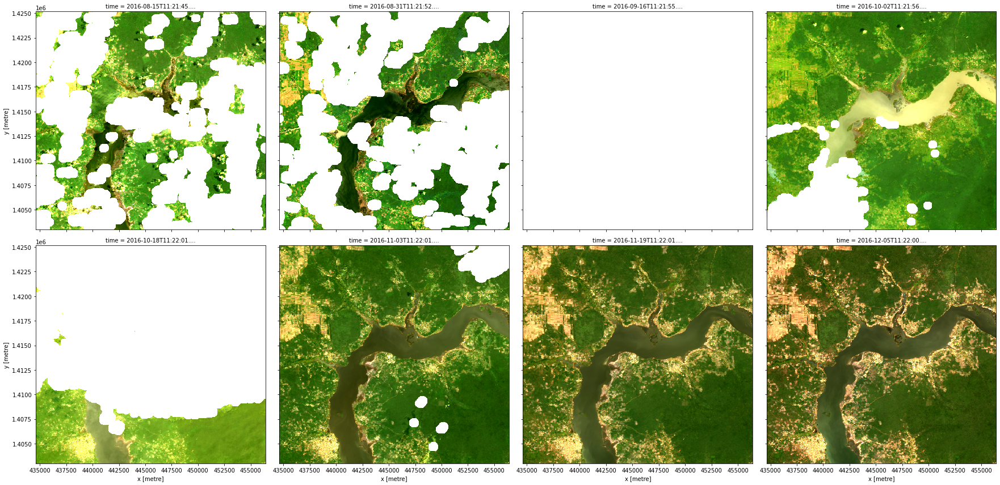

In [11]:
# Apply the mask
buffered_cloud_free = data.where(buffered_mask)

rgb(buffered_cloud_free, col="time")

## Masking out invalid data



We sometimes may also want to mask out only the nodata pixels and retain everything the satellite observed.
In this case we are effectively just replacing our `nodata` value with the more conventional `NaN` values.

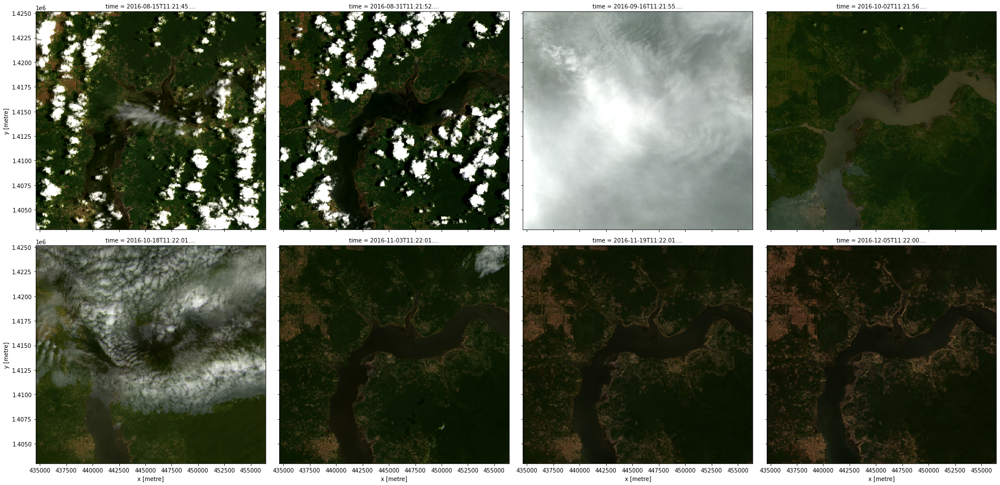

In [12]:
# Set invalid nodata pixels to NaN
valid_data = mask_invalid_data(data)

rgb(valid_data, col='time')

Fortunately our region of interest did not have missing pixels, so these images look identical to the non-masked images from earlier.

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last modified:** Januarary 2020

**Compatible datacube version:** 

In [13]:
print(datacube.__version__)

1.8.3


## Tags
Browse all available tags on the DE Africa User Guide's [Tags Index](../../../genindex.rst)